# *CoastSat*: Multi Beach Downloader


## 1. Initial settings

In [1]:
%load_ext autoreload
%autoreload 2
import os
import numpy as np
import pickle
import warnings
warnings.filterwarnings("ignore")
import matplotlib
matplotlib.use('Qt5Agg')
import matplotlib.pyplot as plt
from matplotlib import gridspec
plt.ion()
import pandas as pd
import geopandas as gpd
from datetime import datetime
from coastsat import SDS_download, SDS_preprocess, SDS_shoreline, SDS_tools, SDS_transects
import helper
import ee
ee.Initialize(project='ee-rafarencoretg')

## 2. Retrieval of the images from GEE

Se crea un diccionario con la información de las playas de la región a descargar.

In [2]:
country_info = {
    "country": "CHILE",
    "country_code": "chi",
    "region": {
        "OHIGGINS": {
            "chi0345": {
                "name": "PLAYA_MATANZAS",
                "slope": 0.074
            },
            "chi0346": {
                "name": "PLAYA_PUPUYA",
                "slope": 0.076
            },
            "chi0356": {
                "name": "PLAYA_PUNTA_DE_LOBOS",
                "slope": 0.075
            }
        }
    }
}

Inicialización de los inputs del código, tales como fechas, región, códigos, pendientes y satélites. Se realiza un chequeo previo a la descarga.

In [3]:
# Sitio de estudio y su codigo
region_name = "OHIGGINS"
geojson_folder = 'CoastSat_Web'

# Rango de fechas
dates = ['2024-01-01', '2024-12-31']

# Satelites (misiones) ['L5','L7','L8','L9','S2']
sat_list = ['L8','L9','S2']

# Directorio de almacenamiento
filepath = os.path.join(os.getcwd(), 'data')

for beach in country_info["region"][region_name]:
    sitename = country_info["region"][region_name][beach]["name"]
    slope = country_info["region"][region_name][beach]["slope"]

    # Region de interes (longitud, latitud) en formato geojson
    geojson_polygon = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f"{beach}_polygon.geojson")
    polygon = SDS_tools.polygon_from_geojson(geojson_polygon)

    # Diccionario con la información del sitio de estudio
    inputs = {'region': region_name, 'id': beach, 'sitename': sitename, 'slope': slope, 
              'polygon': polygon, 'dates': dates, 'sat_list': sat_list, 'filepath':filepath}

    # Chequeo de cantidad de imagenes disponibles
    print(f'\nIMAGENES DISPONIBLES EN {sitename}')
    SDS_download.check_images_available(inputs);


IMAGENES DISPONIBLES EN PLAYA_MATANZAS
Number of images available between 2024-01-01 and 2024-12-31:
- In Landsat Tier 1 & Sentinel-2 Level-1C:
     L8: 60 images
     L9: 56 images
     S2: 118 images
  Total to download: 234 images
L8: 12/60 images already exist, 48 to be downloaded
L9: 11/56 images already exist, 45 to be downloaded
S2: 22/118 images already exist, 96 to be downloaded
- In Landsat Tier 2 (not suitable for time-series analysis):
     L8: 40 images
  Total Tier 2: 40 images

IMAGENES DISPONIBLES EN PLAYA_PUPUYA
Number of images available between 2024-01-01 and 2024-12-31:
- In Landsat Tier 1 & Sentinel-2 Level-1C:
     L8: 60 images
     L9: 56 images
     S2: 117 images
  Total to download: 233 images
L8: 12/60 images already exist, 48 to be downloaded
L9: 11/56 images already exist, 45 to be downloaded
S2: 22/117 images already exist, 95 to be downloaded
- In Landsat Tier 2 (not suitable for time-series analysis):
     L8: 40 images
  Total Tier 2: 40 images

IMAGE

Luego del chequeo, se descargan las imágenes.

In [4]:
for beach in country_info["region"][region_name]:
    sitename = country_info["region"][region_name][beach]["name"]
    slope = country_info["region"][region_name][beach]["slope"]

    # Region de interes (longitud, latitud) en formato geojson
    geojson_polygon = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f"{beach}_polygon.geojson")
    polygon = SDS_tools.polygon_from_geojson(geojson_polygon)

    # Diccionario con la información del sitio de estudio
    inputs = {'region': region_name, 'id': beach, 'sitename': sitename, 'slope': slope, 
              'polygon': polygon, 'dates': dates, 'sat_list': sat_list, 'filepath':filepath}

    # Descarga de imagenes
    print(f"\nDESCARGANDO IMAGENES EN {sitename}")
    metadata = SDS_download.retrieve_images(inputs)


DESCARGANDO IMAGENES EN PLAYA_MATANZAS
GEE initialized (existing token).
Number of images available between 2024-01-01 and 2024-12-31:
- In Landsat Tier 1 & Sentinel-2 Level-1C:
     L8: 60 images
     L9: 56 images
     S2: 118 images
  Total to download: 234 images
L8: 12/60 images already exist, 48 to be downloaded
L9: 11/56 images already exist, 45 to be downloaded
S2: 22/118 images already exist, 96 to be downloaded
- In Landsat Tier 2 (not suitable for time-series analysis):
     L8: 40 images
  Total Tier 2: 40 images

L8: 48 images
100%
L9: 45 images
100%
S2: 96 images
100%
Satellite images downloaded from GEE and save in d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_MATANZAS

DESCARGANDO IMAGENES EN PLAYA_PUPUYA
GEE initialized (existing token).
Number of images available between 2024-01-01 and 2024-12-31:
- In Landsat Tier 1 & Sentinel-2 Level-1C:
     L8: 60 images
     L9: 56 images
     S2: 117 images
  Total to download: 233 images
L8: 12/60 images already exist, 48 

Finalmente, se construye la metadata de los sitios de estudio.

In [5]:
for beach in country_info["region"][region_name]:
    sitename = country_info["region"][region_name][beach]["name"]
    slope = country_info["region"][region_name][beach]["slope"]

    # Region de interes (longitud, latitud) en formato geojson
    geojson_polygon = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f"{beach}_polygon.geojson")
    polygon = SDS_tools.polygon_from_geojson(geojson_polygon)

    # Diccionario con la información del sitio de estudio
    inputs = {'region': region_name, 'id': beach, 'sitename': sitename, 'slope': slope, 
              'polygon': polygon, 'dates': dates, 'sat_list': sat_list, 'filepath':filepath}
    
    # Grabado de metadata
    print(f'\nGRABADO DE METADATA DE {sitename} COMPLETADA')
    metadata = SDS_download.get_metadata(inputs)


GRABADO DE METADATA DE PLAYA_MATANZAS COMPLETADA

GRABADO DE METADATA DE PLAYA_PUPUYA COMPLETADA

GRABADO DE METADATA DE PLAYA_PUNTA_DE_LOBOS COMPLETADA


In [6]:
beaches = dict()

for beach in country_info["region"][region_name]:
    sitename = country_info["region"][region_name][beach]["name"]
    slope = country_info["region"][region_name][beach]["slope"]

    # Region de interes (longitud, latitud) en formato geojson
    geojson_polygon = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f"{beach}_polygon.geojson")
    polygon = SDS_tools.polygon_from_geojson(geojson_polygon)

    # Diccionario con la información del sitio de estudio
    inputs = {'region': region_name, 'id': beach, 'sitename': sitename, 'slope': slope, 
              'polygon': polygon, 'dates': dates, 'sat_list': sat_list, 'filepath':filepath}
    
    # Grabado de metadata
    metadata = SDS_download.get_metadata(inputs)

    # Asegurarse de que beaches[beach] sea un diccionario
    if beach not in beaches:
        beaches[beach] = {}

    # Asignar valores al diccionario
    beaches[beach]['inputs'] = inputs
    beaches[beach]['metadata'] = metadata

    if beach in beaches:
        print(f'{sitename} agregado\n')

print('Diccionario generado correctamente')

PLAYA_MATANZAS agregado

PLAYA_PUPUYA agregado

PLAYA_PUNTA_DE_LOBOS agregado

Diccionario generado correctamente


## 3. Shoreline extraction

In [7]:
overall_settings = dict()


for beach in country_info["region"][region_name]:
    sitename = country_info["region"][region_name][beach]["name"]
    slope = country_info["region"][region_name][beach]["slope"]

    # Region de interes (longitud, latitud) en formato geojson
    geojson_polygon = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f"{beach}_polygon.geojson")
    polygon = SDS_tools.polygon_from_geojson(geojson_polygon)

    # Diccionario con la información del sitio de estudio
    inputs = {'region': region_name, 'id': beach, 'sitename': sitename, 'slope': slope, 
              'polygon': polygon, 'dates': dates, 'sat_list': sat_list, 'filepath':filepath}
    
    # Inicialización de metadata
    metadata = SDS_download.get_metadata(inputs)

    settings = {
        # general parameters:
        'cloud_thresh': 0.5,        # threshold on maximum cloud cover
        'dist_clouds': 300,         # ditance around clouds where shoreline can't be mapped
        'output_epsg': 32718,       # epsg code of spatial reference system desired for the output #28356 #4326 #Codigo en cartesian coordinate system
        # quality control:
        'check_detection': False,    # if True, shows each shoreline detection to the user for validation
        'adjust_detection': False,  # if True, allows user to adjust the postion of each shoreline by changing the threhold
        'save_figure': True,        # if True, saves a figure showing the mapped shoreline for each image
        # [ONLY FOR ADVANCED USERS] shoreline detection parameters:
        'min_beach_area': 1000,     # minimum area (in metres^2) for an object to be labelled as a beach
        'min_length_sl': 500,       # minimum length (in metres) of shoreline perimeter to be valid
        'cloud_mask_issue': False,  # switch this parameter to True if sand pixels are masked (in black) on many images  
        'sand_color': 'default',    # 'default', 'latest', 'dark' (for grey/black sand beaches) or 'bright' (for white sand beaches)
        'pan_off': False,           # True to switch pansharpening off for Landsat 7/8/9 imagery
        's2cloudless_prob': 60,     # probability threshold to identify cloudy pixels in the s2cloudless mask
        
        # add the inputs defined previously
        'inputs': beaches[beach]["inputs"],
    }

    # Asegurarse de que beaches[beach] sea un diccionario
    if beach not in overall_settings:
        overall_settings[beach] = {}

    # Asignar valores al diccionario
    overall_settings[beach]['settings'] = settings

    if beach in overall_settings:
        print(f'{sitename} agregado\n')

print('Diccionario generado correctamente')

PLAYA_MATANZAS agregado

PLAYA_PUPUYA agregado

PLAYA_PUNTA_DE_LOBOS agregado

Diccionario generado correctamente


### Digitize a reference shoreline [HIGHLY RECOMMENDED]

In [8]:
%matplotlib qt
#settings['reference_shoreline'] = SDS_preprocess.get_reference_sl(metadata, settings)
#settings['max_dist_ref'] = 100 # max distance (in meters) allowed from the reference shoreline


for beach in overall_settings:
    sitename = country_info["region"][region_name][beach]["name"]
    print(f'\nCreando linea de costa de referencia para {sitename}')
    overall_settings[beach]["settings"]['reference_shoreline'] = SDS_preprocess.get_reference_sl(beaches[beach]["metadata"], overall_settings[beach]["settings"])
    overall_settings[beach]["settings"]['max_dist_ref'] = 100 # max distance (in meters) allowed from the reference shoreline


Creando linea de costa de referencia para PLAYA_MATANZAS
Reference shoreline already exists and was loaded
Reference shoreline coordinates are in epsg:32718

Creando linea de costa de referencia para PLAYA_PUPUYA
Reference shoreline already exists and was loaded
Reference shoreline coordinates are in epsg:32718

Creando linea de costa de referencia para PLAYA_PUNTA_DE_LOBOS
Reference shoreline already exists and was loaded
Reference shoreline coordinates are in epsg:32718


### Batch shoreline detection

In [9]:
%matplotlib qt

overall_output = dict()

for beach in overall_settings:
    sitename = country_info["region"][region_name][beach]["name"]
    print(f'Identificando linea de costa automatica para {sitename}')
    output = SDS_shoreline.extract_shorelines(beaches[beach]["metadata"], overall_settings[beach]["settings"])
    
    # Asegurarse de que beaches[beach] sea un diccionario
    if beach not in overall_output:
        overall_output[beach] = {}

    # Asignar valores al diccionario
    overall_output[beach]['output'] = output

    if beach in overall_output:
        print(f'Linea de costa para {sitename} detectada\n')

print('Diccionario generado correctamente')

Identificando linea de costa automatica para PLAYA_MATANZAS
Mapping shorelines:
L8:   100%
L9:   100%
S2:   100%
Linea de costa para PLAYA_MATANZAS detectada

Identificando linea de costa automatica para PLAYA_PUPUYA
Mapping shorelines:
L8:   100%
L9:   100%
S2:   100%
Linea de costa para PLAYA_PUPUYA detectada

Identificando linea de costa automatica para PLAYA_PUNTA_DE_LOBOS
Mapping shorelines:
L8:   100%
L9:   100%
S2:   2%Could not map shoreline for this image: 2024-01-08-14-52-23_S2_18HYH_PLAYA_PUNTA_DE_LOBOS_ms.tif
S2:   5%Could not map shoreline for this image: 2024-01-18-14-52-23_S2_18HYH_PLAYA_PUNTA_DE_LOBOS_ms.tif
S2:   9%Could not map shoreline for this image: 2024-02-02-14-52-19_S2_18HYH_PLAYA_PUNTA_DE_LOBOS_ms.tif
S2:   11%Could not map shoreline for this image: 2024-02-07-14-52-23_S2_18HYH_PLAYA_PUNTA_DE_LOBOS_ms.tif
S2:   13%Could not map shoreline for this image: 2024-02-12-14-52-21_S2_18HYH_PLAYA_PUNTA_DE_LOBOS_ms.tif
S2:   14%Could not map shoreline for this image: 20

In [10]:
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    overall_output[beach]['output'] = SDS_tools.remove_duplicates(overall_output[beach]['output']) # removes duplicates (images taken on the same date by the same satellite)
    overall_output[beach]['output'] = SDS_tools.remove_inaccurate_georef(overall_output[beach]['output'], 10) # remove inaccurate georeferencing (set threshold to 10 m)
    print(f'Eliminando duplicados en {sitename}\n')

63 duplicates
1 bad georef
Eliminando duplicados en PLAYA_MATANZAS

64 duplicates
2 bad georef
Eliminando duplicados en PLAYA_PUPUYA

40 duplicates
2 bad georef
Eliminando duplicados en PLAYA_PUNTA_DE_LOBOS



In [11]:
from pyproj import CRS
geomtype = 'points' # choose 'points' or 'lines' for the layer geometry

for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    gdf = SDS_tools.output_to_gdf(overall_output[beach]['output'], geomtype)
    if gdf is None:
        raise Exception("output does not contain any mapped shorelines")
    gdf.crs = CRS(overall_settings[beach]["settings"]['output_epsg']) # set layer projection
    # save GEOJSON layer to file
    gdf.to_file(os.path.join(beaches[beach]["inputs"]['filepath'], beaches[beach]["inputs"]['sitename'], '%s_output_%s.geojson'%(sitename,geomtype)),
                                    driver='GeoJSON', encoding='utf-8')
    print(f'Output points guardados en formato .geojson para {sitename}\n')

Output points guardados en formato .geojson para PLAYA_MATANZAS

Output points guardados en formato .geojson para PLAYA_PUPUYA

Output points guardados en formato .geojson para PLAYA_PUNTA_DE_LOBOS



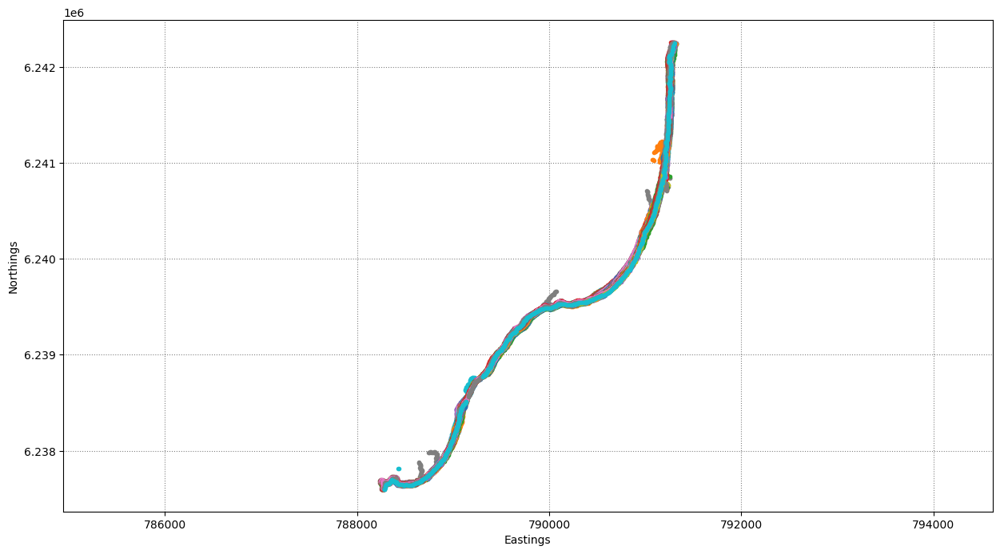

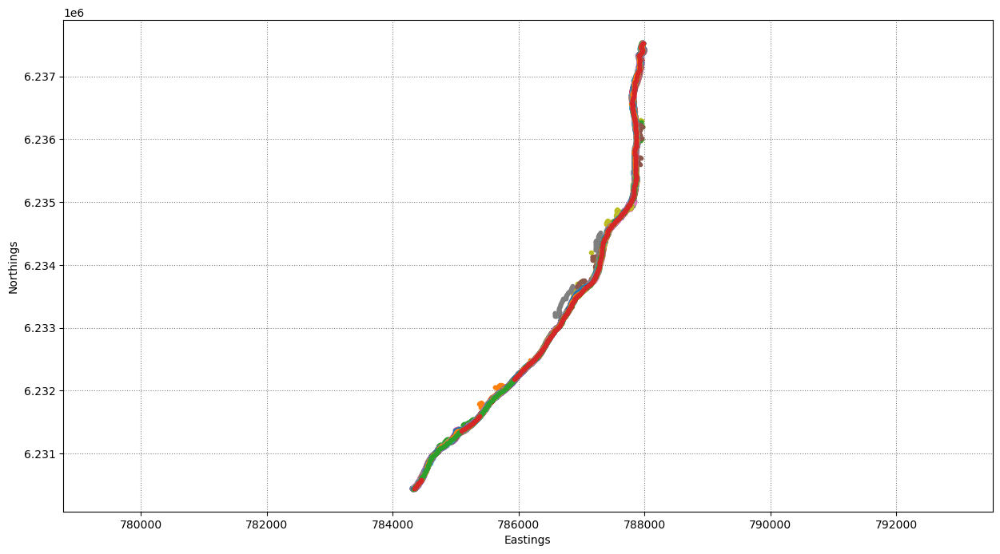

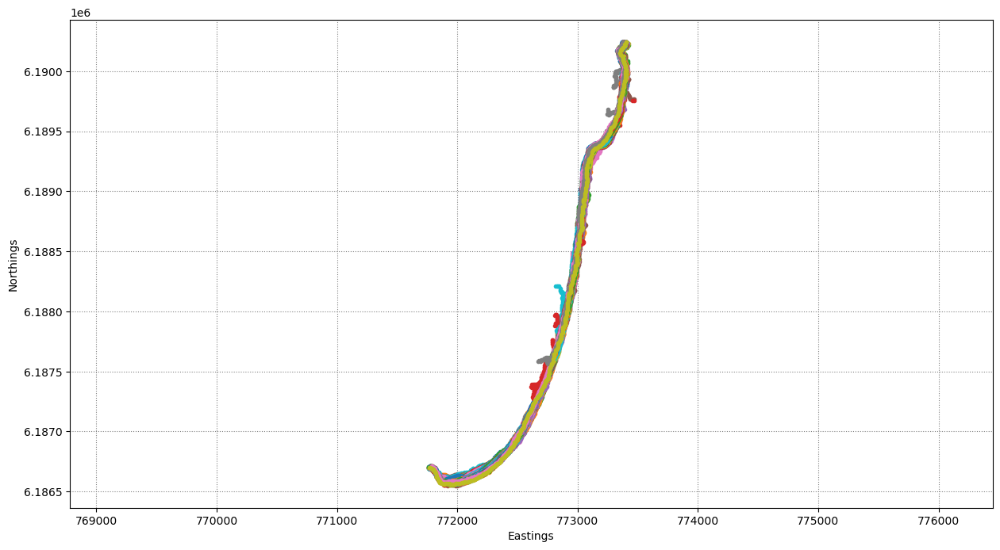

In [13]:
%matplotlib inline
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    fig = plt.figure(figsize=[15,8])

    plt.axis('equal')
    plt.xlabel('Eastings')
    plt.ylabel('Northings')
    plt.grid(linestyle=':', color='0.5')
    for i in range(len(overall_output[beach]['output']['shorelines'])):
        sl = overall_output[beach]['output']['shorelines'][i]
        date = overall_output[beach]['output']['dates'][i]
        plt.plot(sl[:,0], sl[:,1], '.', label=date.strftime('%d-%m-%Y'))
    #plt.legend();

## 4. Shoreline analysis

In [14]:
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    filepath = os.path.join(beaches[beach]["inputs"]['filepath'], sitename)
    with open(os.path.join(filepath, sitename + '_output' + '.pkl'), 'rb') as f:
        output = pickle.load(f)
    # remove duplicates (images taken on the same date by the same satellite)
    output = SDS_tools.remove_duplicates(overall_output[beach]['output'])
    # remove inaccurate georeferencing (set threshold to 10 m)
    output = SDS_tools.remove_inaccurate_georef(overall_output[beach]['output'], 10)
    print(f'Eliminando duplicados en {sitename}\n')


0 duplicates
0 bad georef
Eliminando duplicados en PLAYA_MATANZAS

0 duplicates
0 bad georef
Eliminando duplicados en PLAYA_PUPUYA

0 duplicates
0 bad georef
Eliminando duplicados en PLAYA_PUNTA_DE_LOBOS



In [15]:
overall_transects = dict()

for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    print(f'Cargando transectos para {sitename}')

    geojson_file_epsg_1 = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f'{beach}_transects.geojson')
    geojson_file_epsg_2 = os.path.join(os.getcwd(), geojson_folder, region_name, beach, f'{beach}_transects_transformed.geojson')
    helper.transform_geojson_epsg(geojson_file_epsg_1, geojson_file_epsg_2, overall_settings[beach]["settings"])

    
    gdf = gpd.read_file(geojson_file_epsg_2,driver='GeoJSON')
    transects = SDS_tools.transects_from_geojson(geojson_file_epsg_2)

    # Asegurarse de que beaches[beach] sea un diccionario
    if beach not in overall_transects:
        overall_transects[beach] = {}

    # Asignar valores al diccionario
    overall_transects[beach]['transects'] = transects

    if beach in overall_transects:
        print(f'Transectos cargados para {sitename}\n')

print('Diccionario generado correctamente')


Cargando transectos para PLAYA_MATANZAS
El EPSG actual del archivo es: 4326
Transformado al EPSG: 32718
Archivo GeoJSON transformado guardado en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\CoastSat_Web\OHIGGINS\chi0345\chi0345_transects_transformed.geojson
64 transects have been loaded coordinates are in epsg:32718
Transectos cargados para PLAYA_MATANZAS

Cargando transectos para PLAYA_PUPUYA
El EPSG actual del archivo es: 4326
Transformado al EPSG: 32718
Archivo GeoJSON transformado guardado en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\CoastSat_Web\OHIGGINS\chi0346\chi0346_transects_transformed.geojson
82 transects have been loaded coordinates are in epsg:32718
Transectos cargados para PLAYA_PUPUYA

Cargando transectos para PLAYA_PUNTA_DE_LOBOS
El EPSG actual del archivo es: 4326
Transformado al EPSG: 32718
Archivo GeoJSON transformado guardado en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\CoastSat_Web\OHIGGINS\chi0356\chi0356_transects_transformed.geojson
40 transects have been loaded coordin

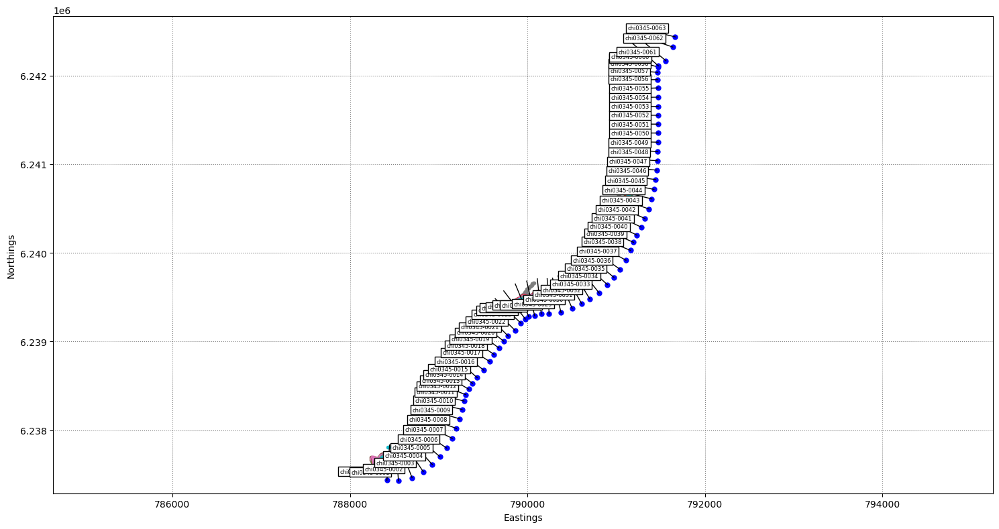

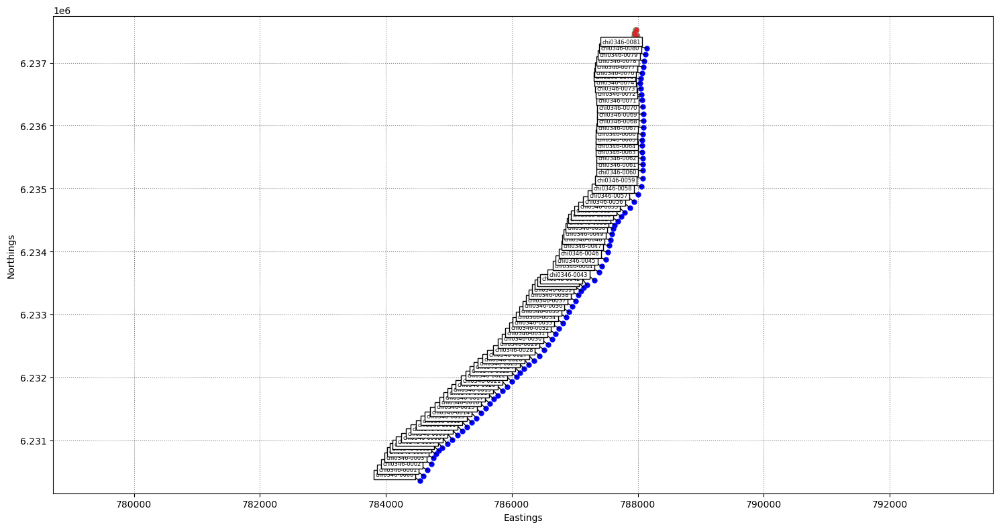

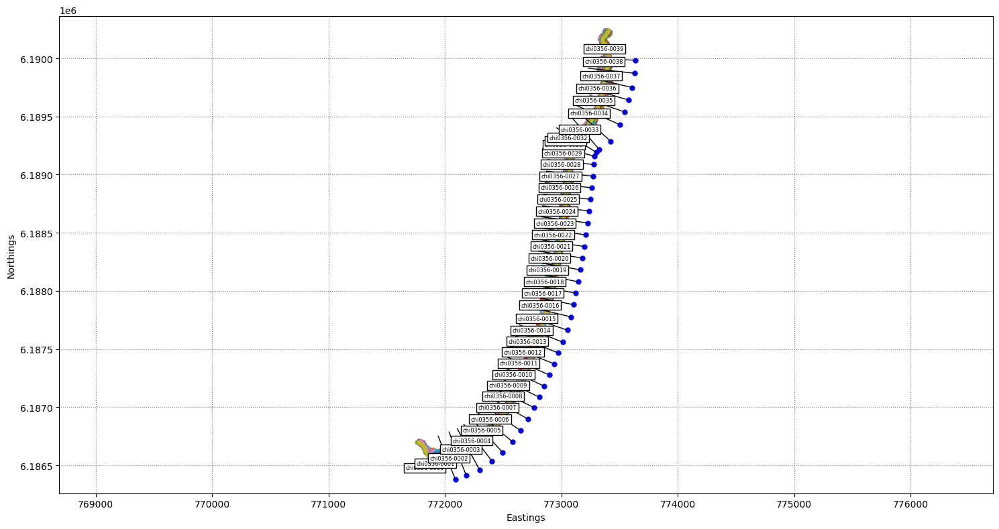

In [16]:
%matplotlib inline
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    fig = plt.figure(figsize=[15,8], tight_layout=True)
    plt.axis('equal')
    plt.xlabel('Eastings')
    plt.ylabel('Northings')
    plt.grid(linestyle=':', color='0.5')

    for i in range(len(overall_output[beach]['output']['shorelines'])):
        sl = overall_output[beach]['output']['shorelines'][i]
        date = overall_output[beach]['output']['dates'][i]
        plt.plot(sl[:,0], sl[:,1], '.', label=date.strftime('%d-%m-%Y'))
    for i,key in enumerate(list(overall_transects[beach]['transects'].keys())): #for key in seccion:  
        plt.plot(overall_transects[beach]['transects'][key][0,0],overall_transects[beach]['transects'][key][0,1], 'bo', ms=5)
        plt.plot(overall_transects[beach]['transects'][key][:,0],overall_transects[beach]['transects'][key][:,1],'k-',lw=1)
        plt.text(overall_transects[beach]['transects'][key][0,0]-100, overall_transects[beach]['transects'][key][0,1]+100, key,
                    va='center', ha='right', bbox=dict(boxstyle="square", ec='k',fc='w'), fontsize=6)
    #plt.legend();
    

In [17]:
settings_transects = { # parameters for computing intersections
                      'along_dist':          25,        # along-shore distance to use for computing the intersection
                      'min_points':          3,         # minimum number of shoreline points to calculate an intersection
                      'max_std':             15,        # max std for points around transect
                      'max_range':           30,        # max range for points around transect
                      'min_chainage':        -100,      # largest negative value along transect (landwards of transect origin)
                      'multiple_inter':      'auto',    # mode for removing outliers ('auto', 'nan', 'max')
                      'auto_prc':            0.1,       # percentage of the time that multiple intersects are present to use the max
                     }

overall_cross_distance = dict()
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    cross_distance = SDS_transects.compute_intersection_QC(overall_output[beach]['output'], overall_transects[beach]['transects'], settings_transects) 

    # Asegurarse de que beaches[beach] sea un diccionario
    if beach not in overall_cross_distance:
        overall_cross_distance[beach] = {}

    # Asignar valores al diccionario
    overall_cross_distance[beach]['cross_distance'] = cross_distance

print('Diccionario generado correctamente')

Diccionario generado correctamente


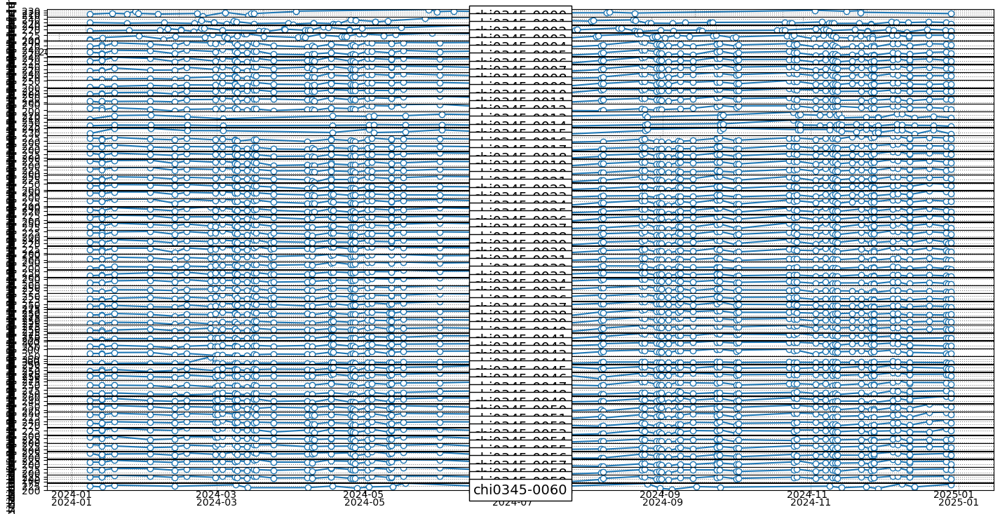

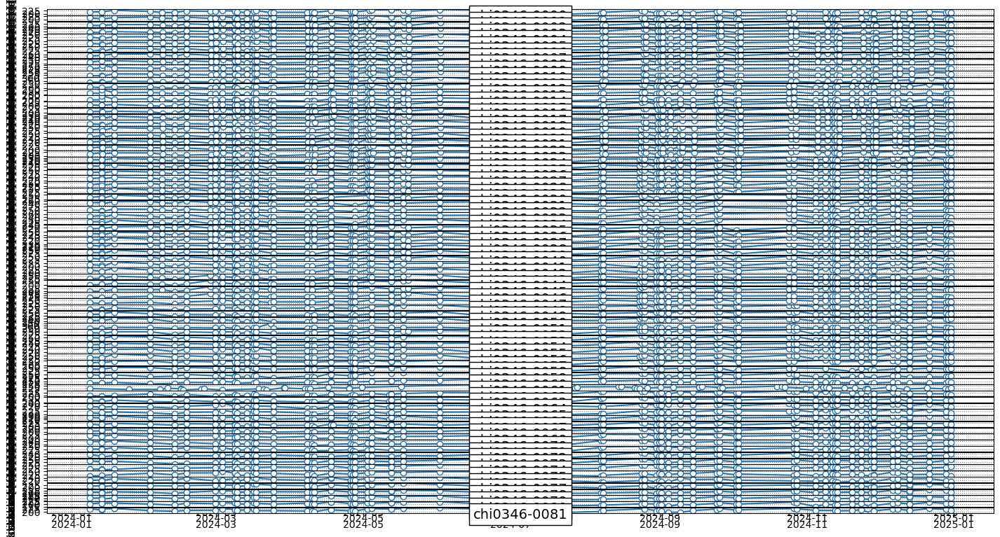

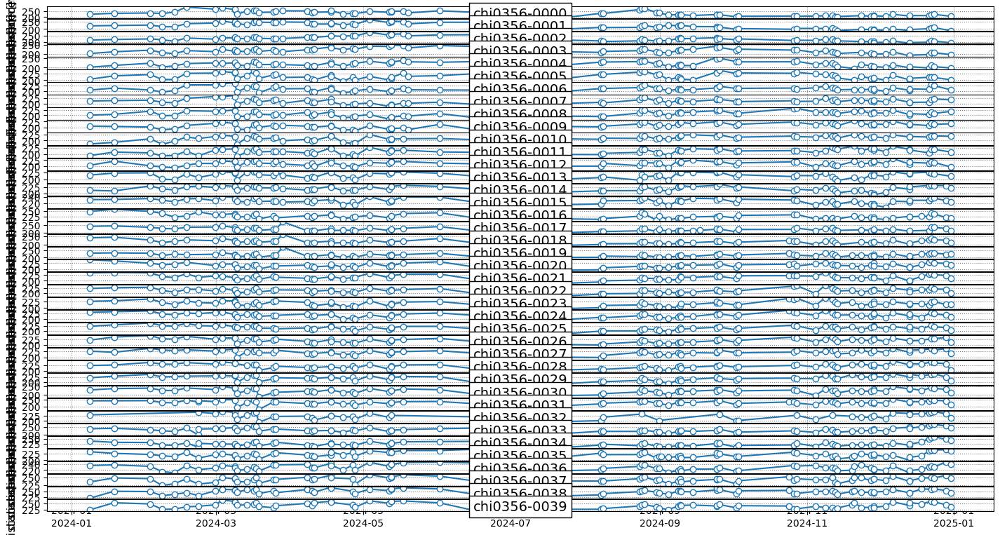

In [18]:
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    filepath = os.path.join(beaches[beach]["inputs"]['filepath'], sitename)
    fig = plt.figure(figsize=[15,8], tight_layout=True)
    gs = gridspec.GridSpec(len(overall_cross_distance[beach]['cross_distance']),1)
    gs.update(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.05)
    for i,key in enumerate(overall_cross_distance[beach]['cross_distance'].keys()):
        if np.all(np.isnan(overall_cross_distance[beach]['cross_distance'][key])):
            continue
        idx_nan = np.isnan(overall_cross_distance[beach]['cross_distance'][key])
        dates = [overall_output[beach]["output"]['dates'][_] for _ in np.where(~idx_nan)[0]]
        chainage = overall_cross_distance[beach]['cross_distance'][key][~idx_nan]
        ax = fig.add_subplot(gs[i,0])
        ax.grid(linestyle=':', color='0.5')
        ax.plot(dates, chainage, '-o', ms=6, mfc='w')
        ax.set_ylabel('distance [m]', fontsize=12)
        ax.text(0.5,0.95, key, bbox=dict(boxstyle="square", ec='k',fc='w'), ha='center',
                va='top', transform=ax.transAxes, fontsize=14)
    fig.savefig(os.path.join(filepath,'%s_timeseries_raw.jpg'%sitename),dpi=200)

In [19]:
for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    # save a .csv file for Excel users
    out_dict = dict([])
    out_dict['dates'] = overall_output[beach]['output']['dates']
    for key in overall_transects[beach]['transects'].keys():
        out_dict[key] = overall_cross_distance[beach]['cross_distance'][key]
    df = pd.DataFrame(out_dict)
    fn = os.path.join(overall_settings[beach]['settings']['inputs']['filepath'],overall_settings[beach]['settings']['inputs']['sitename'],
                    'transect_time_series.csv')
    df.to_csv(fn, sep=',')
    print('Time-series of the shoreline change along the transects saved as:\n%s'%fn)

Time-series of the shoreline change along the transects saved as:
d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_MATANZAS\transect_time_series.csv
Time-series of the shoreline change along the transects saved as:
d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUPUYA\transect_time_series.csv
Time-series of the shoreline change along the transects saved as:
d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\transect_time_series.csv


## 4. Tidal correction

**Option 2:** Usar un archivo local con los datos de mareas de alguna estación.

Antes de correr esto, correr el archivo `obtener_marea.ipynb`, dentro de la carpeta Mareas, para generar el archivo que contiene las mareas de la estación de boyeruca.

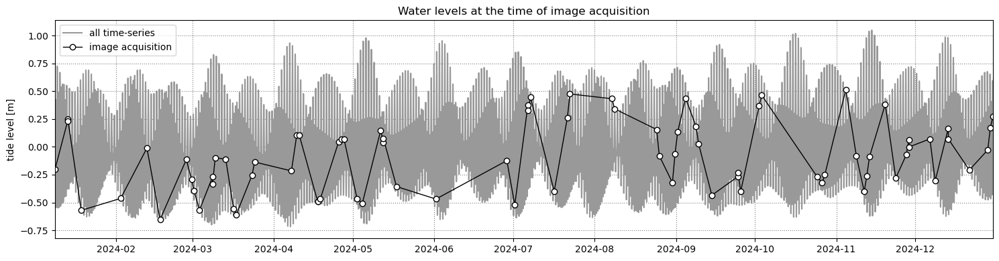

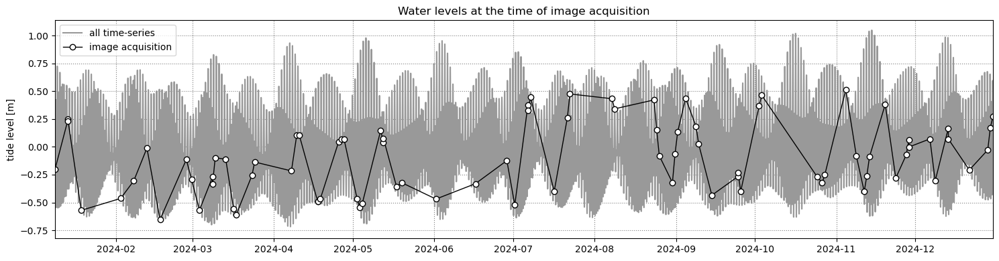

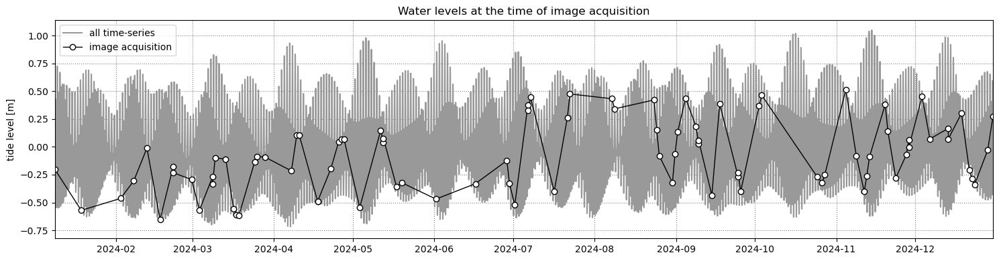

In [20]:
# load the measured tide data
filepath_tides = os.path.join(os.getcwd(),'Mareas', 'mareas_boyeruca_final.csv')
tide_data = pd.read_csv(filepath_tides)

dates_ts = [pd.to_datetime(_).to_pydatetime() for _ in tide_data['date']]
tides_ts = np.array(tide_data['tide'])


for beach in overall_output:
    sitename = country_info["region"][region_name][beach]["name"]
    # get tide levels corresponding to the time of image acquisition
    dates_sat = overall_output[beach]['output']['dates']

    #Mi codigo
    fechas_timestamp = pd.to_datetime(tide_data['date'])
    # Convertir las fechas a un índice de fecha y hora
    fechas_index = pd.DatetimeIndex(fechas_timestamp)

    # Definir la zona horaria UTC
    tz_utc = 'UTC'

    # Convertir las fechas al huso horario UTC
    fechas_utc = fechas_index.tz_localize(tz_utc)
    fechas_utc = pd.to_datetime(fechas_utc)

    # Encontrar el índice del valor más cercano en fechas_utc para cada fecha en dates_sat
    indices = fechas_utc.searchsorted(dates_sat)

    # Ajustar los índices para asegurar que estén dentro del rango
    indices = np.clip(indices, 0, len(fechas_utc) - 1)

    # Usar los índices para obtener los valores correspondientes en tides_ts
    tides_sat = tides_ts[indices]

    '''
    dates_ts = [pd.to_datetime(_).to_pydatetime() for _ in tide_data['dates']]
    tides_ts = np.array(tide_data['tide'])

    # get tide levels corresponding to the time of image acquisition
    dates_sat = output['dates']
    tides_sat = SDS_tools.get_closest_datapoint(dates_sat, dates_ts, tides_ts)
    '''

    # plot the subsampled tide data
    fig, ax = plt.subplots(1,1,figsize=(15,4), tight_layout=True)
    ax.grid(which='major', linestyle=':', color='0.5')
    ax.plot(dates_ts, tides_ts, '-', color='0.6', label='all time-series')
    ax.plot(dates_sat, tides_sat, '-o', color='k', ms=6, mfc='w',lw=1, label='image acquisition')
    ax.set(ylabel='tide level [m]',xlim=[dates_sat[0],dates_sat[-1]], title='Water levels at the time of image acquisition');
    ax.legend();

Apply tidal correction using a linear slope and a reference elevation to which project all the time-series of cross-shore change (to get time-series at Mean Sea Level, set `reference_elevation` to 0. You also need an estimate of the beach slope. 

Tidally-corrected time-series of the shoreline change along the transects saved as:
d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\transect_time_series_tidally_corrected.csv


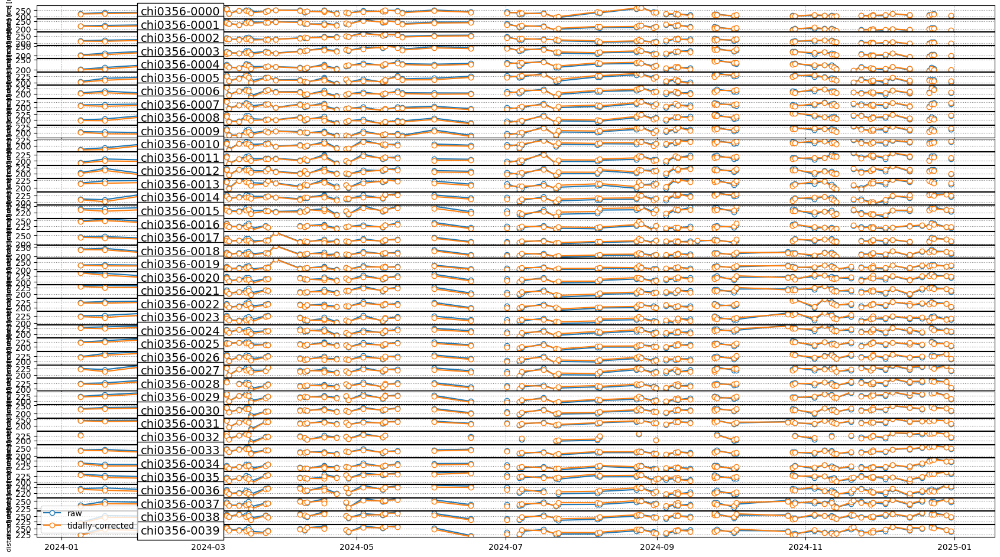

In [21]:
# tidal correction along each transect
reference_elevation = 0 # elevation at which you would like the shoreline time-series to be
cross_distance_tidally_corrected = {}
for key in cross_distance.keys():
    correction = (tides_sat-reference_elevation)/slope
    cross_distance_tidally_corrected[key] = cross_distance[key] + correction
    
# store the tidally-corrected time-series in a .csv file
out_dict = dict([])
out_dict['dates'] = dates_sat
for key in cross_distance_tidally_corrected.keys():
    out_dict[key] = cross_distance_tidally_corrected[key]
df = pd.DataFrame(out_dict)
fn = os.path.join(settings['inputs']['filepath'],settings['inputs']['sitename'],
                  'transect_time_series_tidally_corrected.csv')
df.to_csv(fn, sep=',')
print('Tidally-corrected time-series of the shoreline change along the transects saved as:\n%s'%fn)

# plot the time-series of shoreline change (both raw and tidally-corrected)
fig = plt.figure(figsize=[18,10], tight_layout=True)
gs = gridspec.GridSpec(len(cross_distance),1)
gs.update(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.05)
for i,key in enumerate(cross_distance.keys()):
    if np.all(np.isnan(cross_distance[key])):
        continue
    ax = fig.add_subplot(gs[i,0])
    ax.grid(linestyle=':', color='0.5')
    ax.plot(output['dates'], cross_distance[key], '-o', ms=6, mfc='w', label='raw')
    ax.plot(output['dates'], cross_distance_tidally_corrected[key], '-o', ms=6, mfc='w', label='tidally-corrected')
    ax.set_ylabel('distance [m]', fontsize=8)
    ax.text(0.15,0.95, key, bbox=dict(boxstyle="square", ec='k',fc='w'), ha='center',
            va='top', transform=ax.transAxes, fontsize=14)
ax.legend();

## 5. Time-series post-processing

Finally, we can post-process the time-series of shoreline change to remove obvious outliers and spikes in the data and average the time-series over different time-frames (seasonally or monthly).

To demonstrate these functionalities, we load a full time-series of shoreline change at Narrabeen from Landsat imagery between 1984 and 2021. These shorelines were mapped automatically without manual quality control, intersected with the transects and tidally-corrected.

Imagen guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\CoastSat\shorelines_mapped_from_1985.png
Series temporales cargadas y procesadas correctamente.


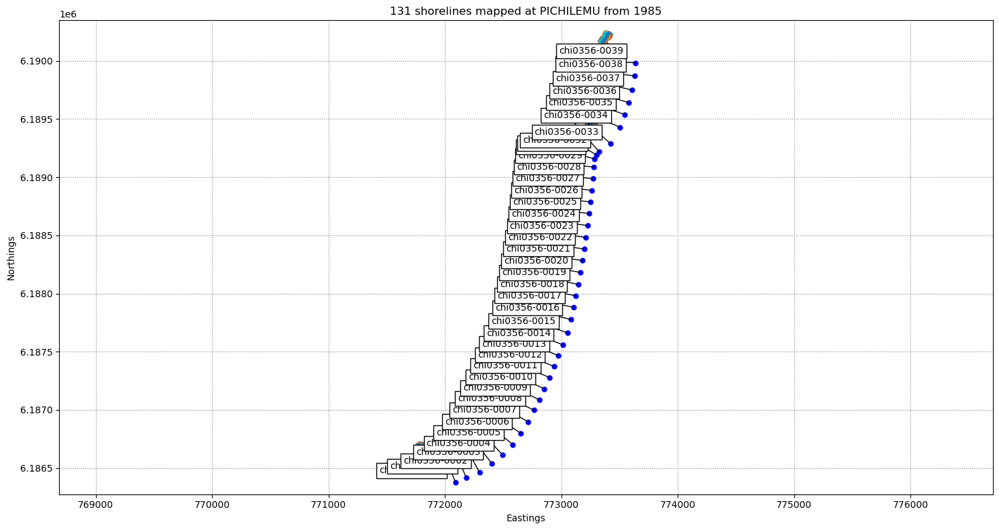

In [ ]:
%matplotlib inline
# Cargar las líneas de costa mapeadas desde 1985
filename_output = os.path.join(settings['inputs']['filepath'],
                               settings['inputs']['sitename'],
                               f"{settings['inputs']['sitename']}_output.pkl")


with open(filename_output, 'rb') as f:
    output = pickle.load(f)

# Plotear las líneas de costa mapeadas
fig = plt.figure(figsize=[15, 8], tight_layout=True)
plt.axis('equal')
plt.xlabel('Eastings')
plt.ylabel('Northings')
plt.grid(linestyle=':', color='0.5')
plt.title(f"{len(output['shorelines'])} shorelines mapped at PICHILEMU from 1985")
for i in range(len(output['shorelines'])):
    sl = output['shorelines'][i]
    date = output['dates'][i]
    plt.plot(sl[:, 0], sl[:, 1], '.', label=date.strftime('%d-%m-%Y'))

for i, key in enumerate(list(transects.keys())):
    plt.plot(transects[key][0, 0], transects[key][0, 1], 'bo', ms=5)
    plt.plot(transects[key][:, 0], transects[key][:, 1], 'k-', lw=1)
    plt.text(
        transects[key][0, 0] - 100, transects[key][0, 1] + 100, key,
        va='center', ha='right', bbox=dict(boxstyle="square", ec='k', fc='w')
    )

# Guardar la figura
output_image_path = os.path.join(settings['inputs']['filepath'],
                                 settings['inputs']['sitename'],
                                 "Resultados",
                                 "CoastSat")
os.makedirs(output_image_path, exist_ok=True)  # Crear directorio si no existe
image_file_name = os.path.join(output_image_path, "shorelines_mapped_from_1985.png")
plt.savefig(image_file_name, dpi=300)  # Ajusta dpi si es necesario
print(f"Imagen guardada en: {image_file_name}")

# Cargar las series temporales largas (1985-2021)
filepath = os.path.join(settings['inputs']['filepath'],
                        settings['inputs']['sitename'],
                        "transect_time_series_tidally_corrected.csv")
df = pd.read_csv(filepath, parse_dates=['dates'])

# Procesar las series temporales
dates = [_.to_pydatetime() for _ in df['dates']]
cross_distance = dict()
for key in transects.keys():
    cross_distance[key] = np.array(df[key])

print("Series temporales cargadas y procesadas correctamente.")


#### 5.1 Despiking the time-series

The tidally-corrected time-series of shoreline change obtained with the steps above may still contain some outliers (from cloud shadows, false detections etc). The function `SDS_transects.reject_outliers()` was developed to remove obvious outliers in the time-series, by removing the points that do not make physical sense in a shoreline change setting. 

For example, the shoreline can experience rapid erosion after a large storm, but it will then take time to recover and return to its previous state. Therefore, if the shoreline erodes/accretes suddenly of a significant amount (`max_cross_change`) and then immediately returns to its previous state, this spike does not make any physical sense and can be considered an outlier. Additionally, this function also checks that the Otsu thresholds used to map the shoreline are within the typical range defined by `otsu_threshold`, with values outside this range identified as outliers.

In [ ]:
# remove outliers in the time-series (coastal despiking)
#No podemos correr esto.. hay un problema en la # de fechas en output y en los archivos creados
settings_outliers = {'max_cross_change':   40,             # maximum cross-shore change observable between consecutive timesteps
                     'otsu_threshold':     [-.5,0],        # min and max intensity threshold use for contouring the shoreline
                     'plot_fig':           True,           # whether to plot the intermediate steps
                    }
cross_distance = SDS_transects.reject_outliers(cross_distance,output,settings_outliers)

IndexError: boolean index did not match indexed array along axis 0; size of axis is 89 but size of corresponding boolean axis is 131

We can also plot the Otsu threholds for the shorelines mapped at this site to see if there are any obvious outliers and adjust the values of `otsu_threshold`.

Figura guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\CoastSat\otsu_thresholds.jpg


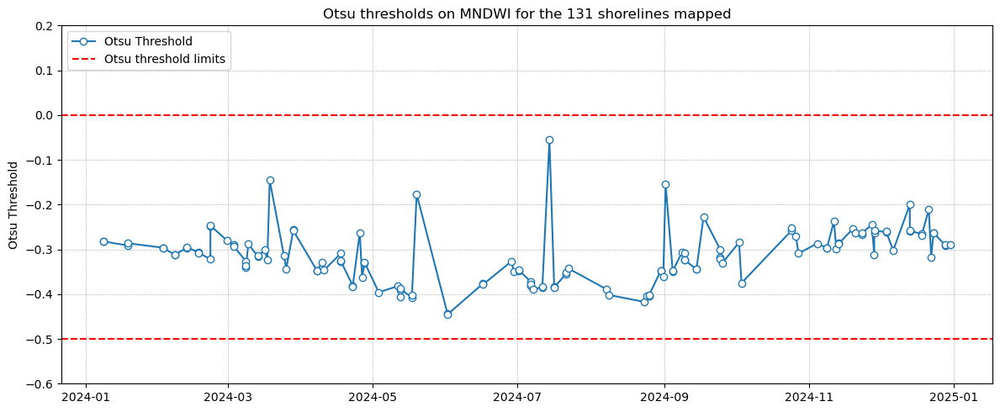

In [ ]:
%matplotlib inline

# Crear la figura para los umbrales de Otsu
fig, ax = plt.subplots(1, 1, figsize=[12, 5], tight_layout=True)
ax.grid(which='major', linestyle=':', linewidth=0.5, color='0.5')
ax.plot(output['dates'], output['MNDWI_threshold'], 'o-', mfc='w', label='Otsu Threshold')
ax.axhline(y=-0.5, linestyle='--', color='r', label='Otsu threshold limits')
ax.axhline(y=0, linestyle='--', color='r')
ax.set(
    title=f'Otsu thresholds on MNDWI for the {len(output["shorelines"])} shorelines mapped',
    ylim=[-0.6, 0.2],
    ylabel='Otsu Threshold'
)
ax.legend(loc='upper left')

# Guardar la figura
output_image_path = os.path.join(settings['inputs']['filepath'],
                                 settings['inputs']['sitename'],
                                 "Resultados",
                                 "CoastSat")
os.makedirs(output_image_path, exist_ok=True)  # Crear el directorio si no existe
image_file_name = os.path.join(output_image_path, "otsu_thresholds.jpg")
fig.savefig(image_file_name, dpi=300)  # Ajusta dpi para mayor calidad
print(f"Figura guardada en: {image_file_name}")


In [ ]:
outliers = []
for i in range(len(output['MNDWI_threshold'])):
    if output['MNDWI_threshold'][i] >= 0 or output['MNDWI_threshold'][i] <= -0.5:
        outliers.append([i, output['MNDWI_threshold'][i]])
        #print(f'La imagen con indice {i} y fecha {output['dates'][i]} tiene un valor de MNDWI threshold de {output['MNDWI_threshold'][i]}')

#### 5.2 Seasonal averaging and long-term trends

The cell below shows how to calculate seasonal averages on the time-series with `SDS_transects.seasonal_average()` and calculate the long-term trend with `SDS_transects.calculate_trend`.

Figura de estacionalidad guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Estacional\seasonality_chi0356-0000.png
Figura de estacionalidad guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Estacional\seasonality_chi0356-0001.png
Figura de estacionalidad guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Estacional\seasonality_chi0356-0002.png
Figura de estacionalidad guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Estacional\seasonality_chi0356-0003.png
Figura de estacionalidad guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Estacional\seasonality_chi0356-0004.png
Figura de estacionalidad guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Estacional\seasonality_chi0356-0005.png
Figura de 

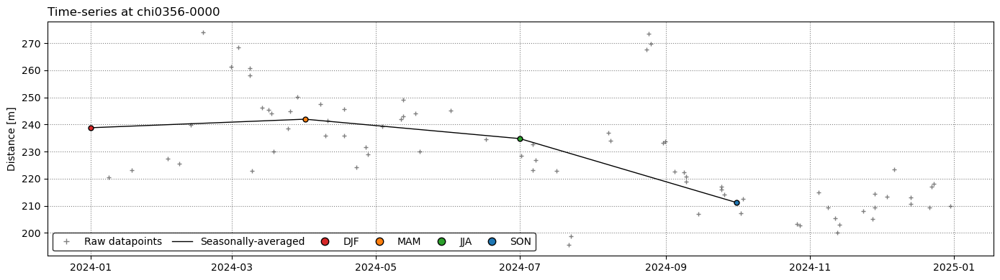

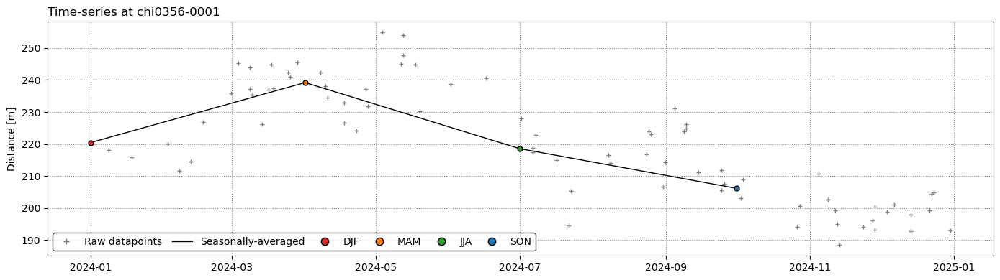

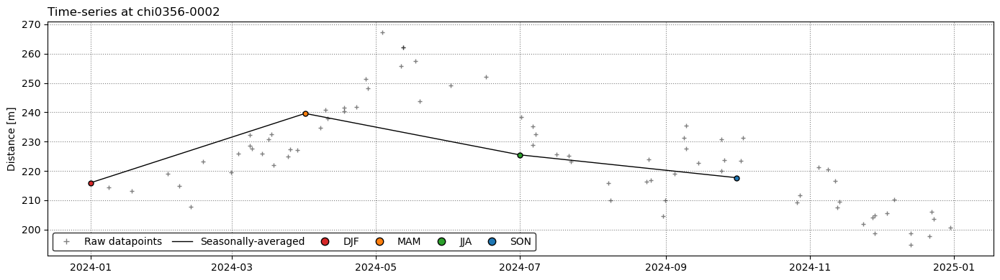

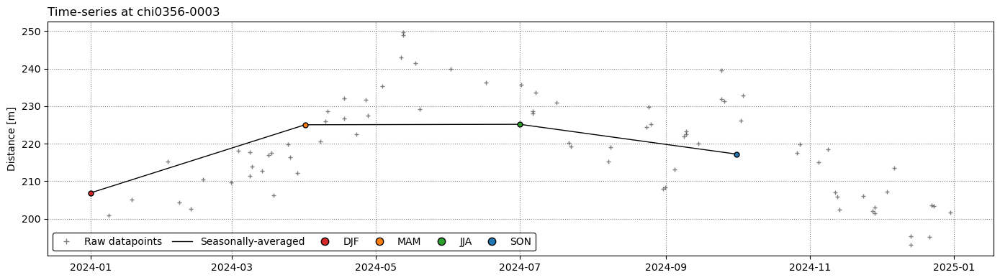

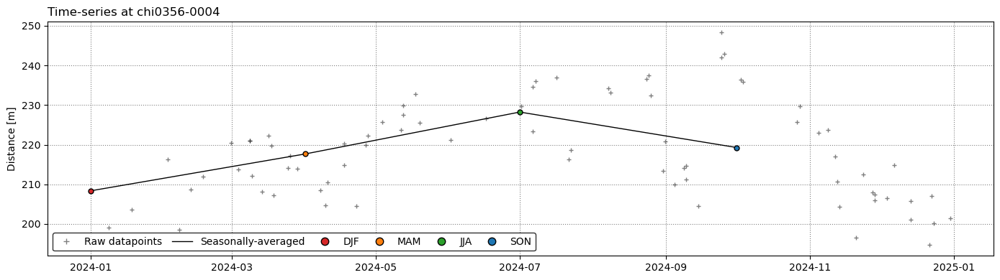

...

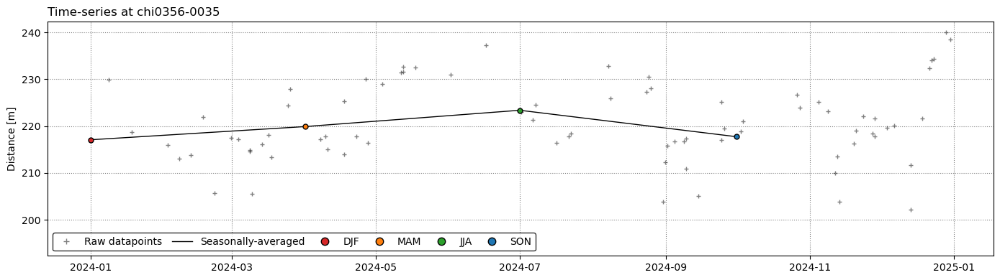

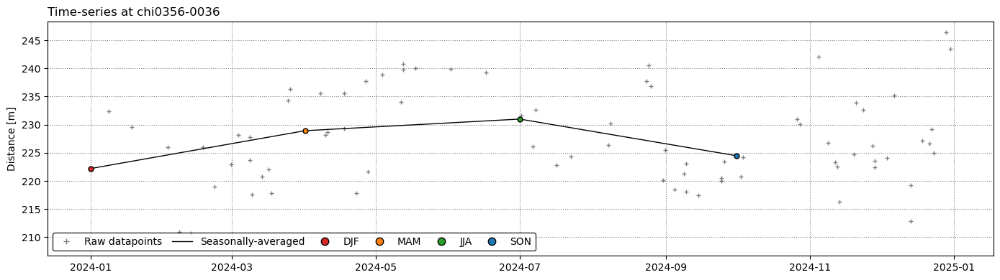

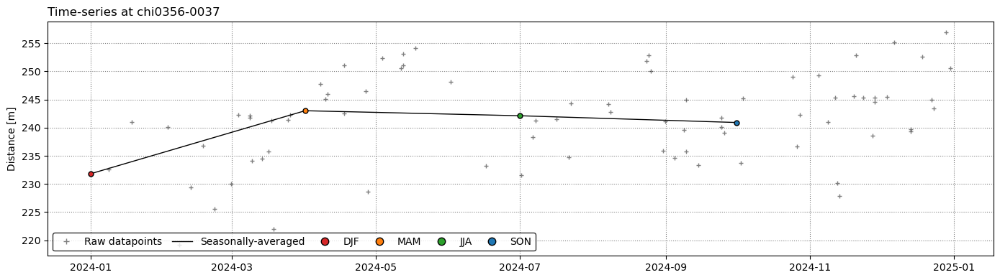

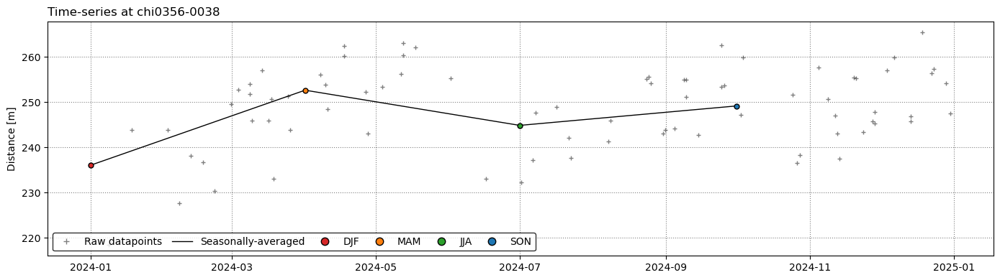

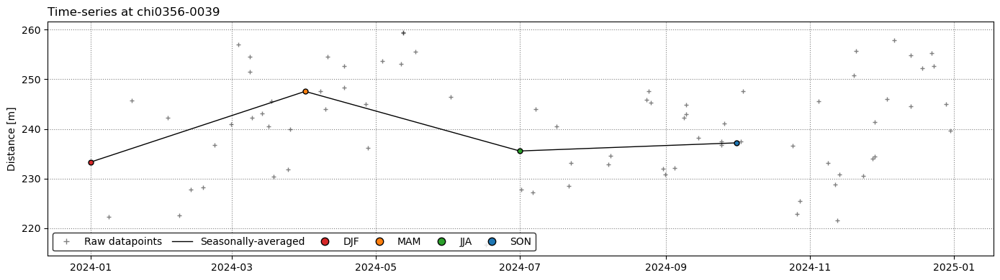

In [ ]:
%matplotlib inline
# Definir colores para las estaciones
season_colors = {'DJF': 'C3', 'MAM': 'C1', 'JJA': 'C2', 'SON': 'C0'}

trending = []
estacionalidad = pd.DataFrame()

# Ruta para guardar resultados
output_dir = os.path.join(settings['inputs']['filepath'],
                          settings['inputs']['sitename'],
                          "Resultados",
                          "Transectos_Estacional")
os.makedirs(output_dir, exist_ok=True)  # Crear directorio si no existe

# Procesar cada transecto
for key in cross_distance.keys():
    chainage = cross_distance[key]
    # Remover valores NaN
    idx_nan = np.isnan(chainage)
    dates_nonan = [dates[_] for _ in np.where(~idx_nan)[0]]
    chainage = chainage[~idx_nan]

    # Calcular promedios estacionales (DJF, MAM, JJA, SON)
    dict_seas, dates_seas, chainage_seas, list_seas = SDS_transects.seasonal_average(dates_nonan, chainage)

    # Calcular tendencia a largo plazo
    trend, y = SDS_transects.calculate_trend(dates_seas, chainage_seas)

    # Crear gráfico de promedios estacionales
    fig, ax = plt.subplots(1, 1, figsize=[14, 4], tight_layout=True)
    ax.grid(which='major', linestyle=':', color='0.5')
    ax.set_title(f'Time-series at {key}', x=0, ha='left')
    ax.set(ylabel='Distance [m]')
    ax.plot(dates_nonan, chainage, '+', lw=1, color='k', mfc='w', ms=4, alpha=0.5, label='Raw datapoints')
    ax.plot(dates_seas, chainage_seas, '-', lw=1, color='k', mfc='w', ms=4, label='Seasonally-averaged')
    for k, seas in enumerate(dict_seas.keys()):
        ax.plot(
            dict_seas[seas]['dates'], dict_seas[seas]['chainages'],
            'o', mec='k', color=season_colors[seas], label=seas, ms=5
        )
    # ax.plot(dates_seas, y, '--', color='b', label=f'Trend {trend:.1f} m/year')
    ax.legend(loc='lower left', ncol=7, markerscale=1.5, frameon=True, edgecolor='k', columnspacing=1)

    # Guardar figura individual
    figure_path = os.path.join(output_dir, f"seasonality_{key}.png")
    plt.savefig(figure_path, dpi=300)
    print(f"Figura de estacionalidad guardada en: {figure_path}")

    # Agregar datos a las listas
    trending.append(trend)
    estacionalidad[key] = dict_seas

# Crear DataFrame para tendencias y guardar como CSV
tendencia = pd.DataFrame({
    'seccion': list(cross_distance.keys()),
    'tendencia': trending
})

tendencia_csv_path = os.path.join(output_dir, "tendencias.csv")
tendencia.to_csv(tendencia_csv_path, index=False)
print(f"Tendencias guardadas en: {tendencia_csv_path}")


In [ ]:
#Estudio por estación
print(estacionalidad)

                                          chi0356-0000  \
DJF  {'dates': [2024-01-01 00:00:00+00:00], 'chaina...   
MAM  {'dates': [2024-04-01 00:00:00+00:00], 'chaina...   
JJA  {'dates': [2024-07-01 00:00:00+00:00], 'chaina...   
SON  {'dates': [2024-10-01 00:00:00+00:00], 'chaina...   

                                          chi0356-0001  \
DJF  {'dates': [2024-01-01 00:00:00+00:00], 'chaina...   
MAM  {'dates': [2024-04-01 00:00:00+00:00], 'chaina...   
JJA  {'dates': [2024-07-01 00:00:00+00:00], 'chaina...   
SON  {'dates': [2024-10-01 00:00:00+00:00], 'chaina...   

                                          chi0356-0002  \
DJF  {'dates': [2024-01-01 00:00:00+00:00], 'chaina...   
MAM  {'dates': [2024-04-01 00:00:00+00:00], 'chaina...   
JJA  {'dates': [2024-07-01 00:00:00+00:00], 'chaina...   
SON  {'dates': [2024-10-01 00:00:00+00:00], 'chaina...   

                                          chi0356-0003  \
DJF  {'dates': [2024-01-01 00:00:00+00:00], 'chaina...   
MAM  {'date

Exportamos la tendencia de la playa, junto con los valores estacionales.

In [ ]:
#Exportamos archivos con tendendias y estacionalidad
dn = os.path.join(settings['inputs']['filepath'],settings['inputs']['sitename'],
                  'trend_series_tidally_corrected.csv')
tendencia.to_csv(dn, sep=',')
print('Trend of tidally-corrected time-series saved as:\n%s'%dn)

rn = os.path.join(settings['inputs']['filepath'],settings['inputs']['sitename'],
                  'season_time_series.csv')
estacionalidad.to_csv(rn, sep=',')
print('Season of tidally-corrected time-series saved as:\n%s'%dn)

Trend of tidally-corrected time-series saved as:
d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\trend_series_tidally_corrected.csv
Season of tidally-corrected time-series saved as:
d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\trend_series_tidally_corrected.csv


#### 5.3 Monthly averages

The cell below shows how to calculate seasonal averages on the time-series with `SDS_transects.monthly_average()` and plot them.

Figura de promedios mensuales guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Mensual\monthly_chi0356-0000.png
Figura de promedios mensuales guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Mensual\monthly_chi0356-0001.png
Figura de promedios mensuales guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Mensual\monthly_chi0356-0002.png
Figura de promedios mensuales guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Mensual\monthly_chi0356-0003.png
Figura de promedios mensuales guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Mensual\monthly_chi0356-0004.png
Figura de promedios mensuales guardada en: d:\Rafael Rencoret\SIMONA\CoastSat-RRG\data\PLAYA_PUNTA_DE_LOBOS\Resultados\Transectos_Mensual\monthly_chi0356-0005.png
Figura de promedios me

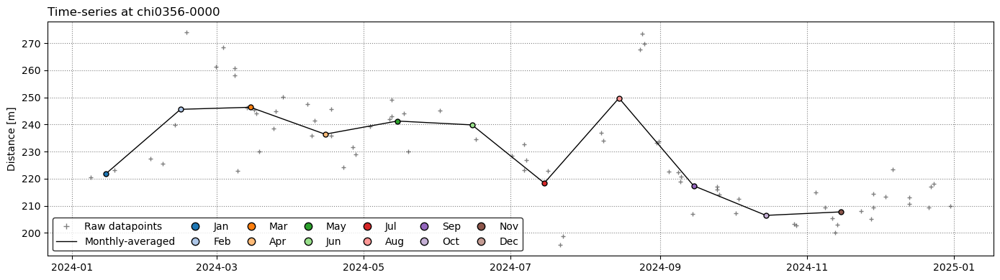

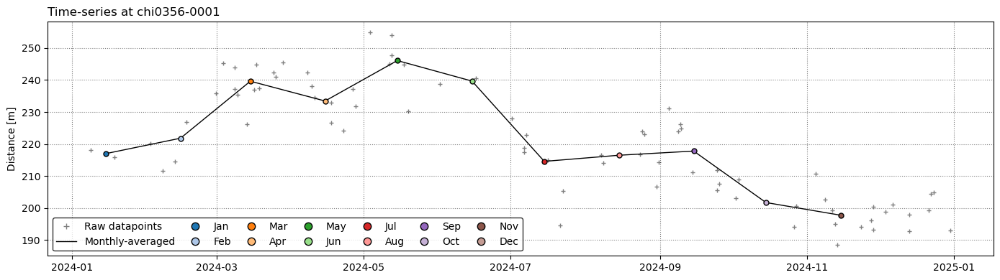

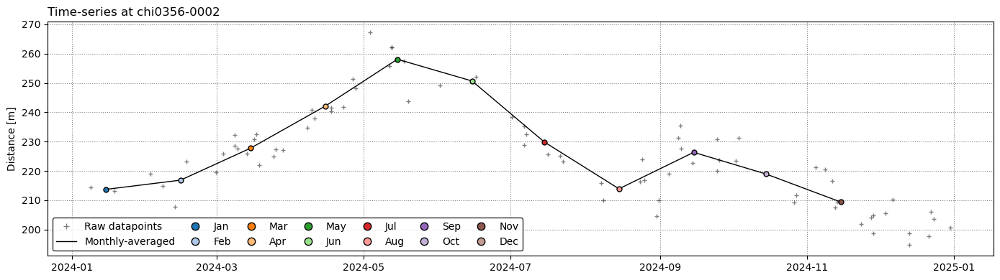

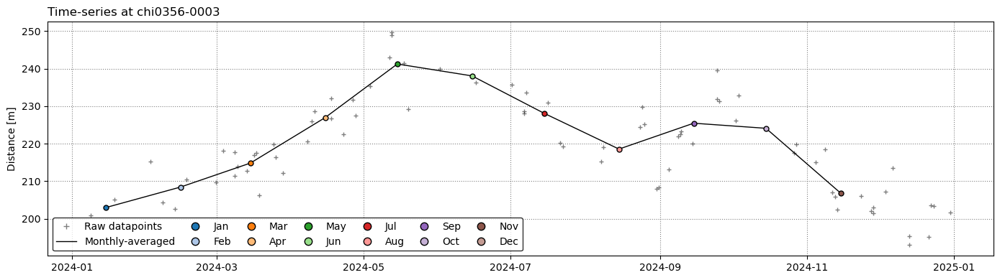

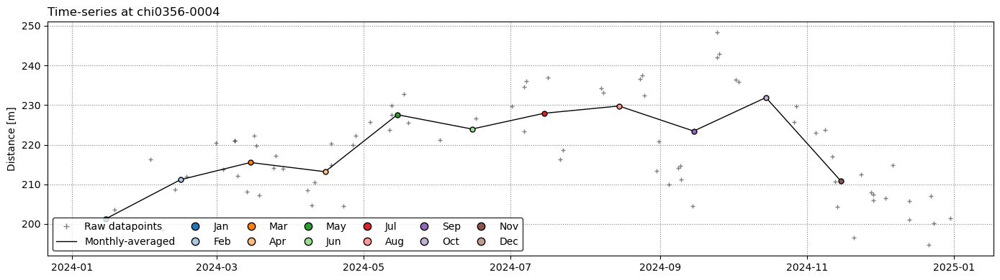

...

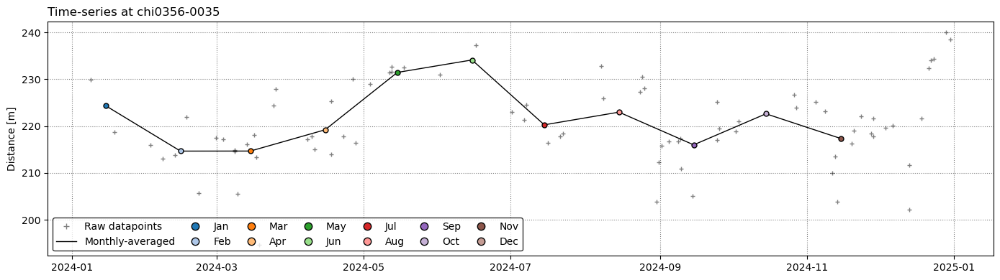

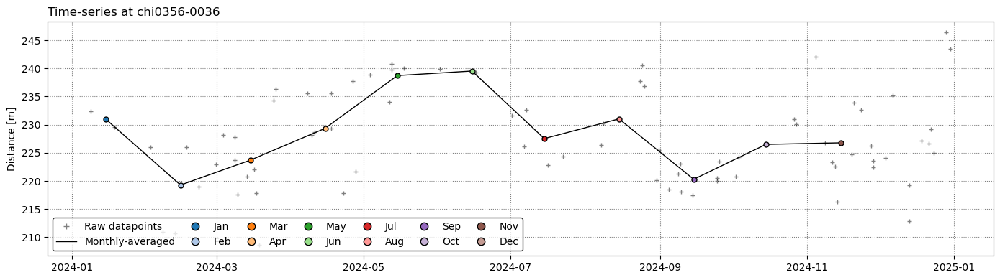

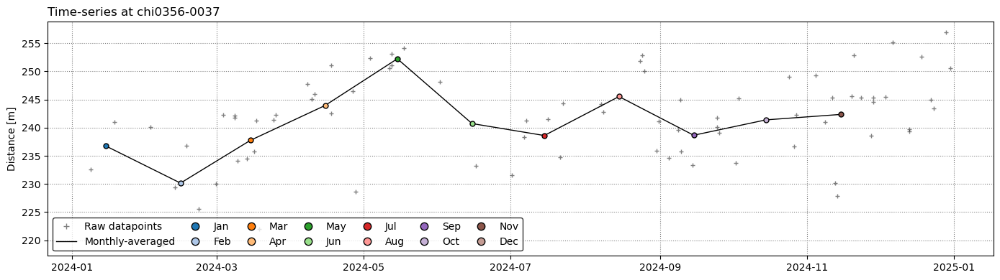

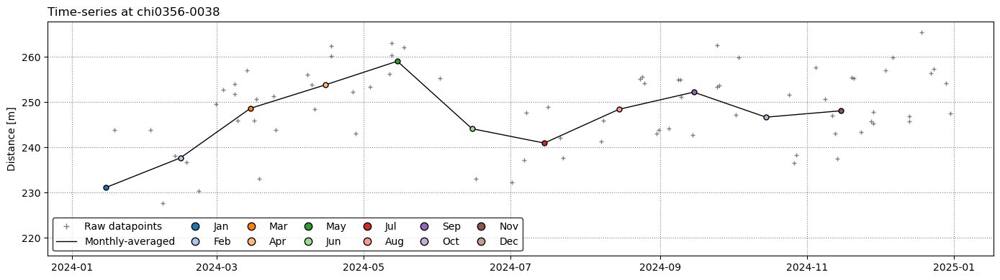

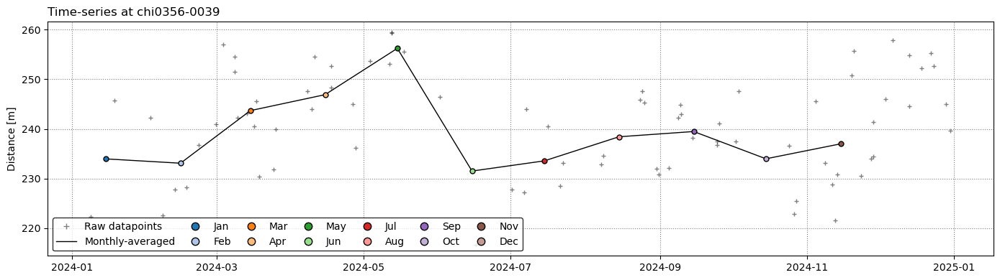

In [ ]:
%matplotlib inline
# Obtener el mapa de colores para los meses
month_colors = plt.cm.get_cmap('tab20')

# Ruta para guardar resultados
output_dir = os.path.join(settings['inputs']['filepath'],
                          settings['inputs']['sitename'],
                          "Resultados",
                          "Transectos_Mensual")
os.makedirs(output_dir, exist_ok=True)  # Crear directorio si no existe

# Procesar cada transecto
for key in cross_distance.keys():
    chainage = cross_distance[key]
    # Remover valores NaN
    idx_nan = np.isnan(chainage)
    dates_nonan = [dates[_] for _ in np.where(~idx_nan)[0]]
    chainage = chainage[~idx_nan]

    # Calcular promedios mensuales
    dict_month, dates_month, chainage_month, list_month = SDS_transects.monthly_average(dates_nonan, chainage)

    # Crear gráfico de promedios mensuales
    fig, ax = plt.subplots(1, 1, figsize=[14, 4], tight_layout=True)
    ax.grid(which='major', linestyle=':', color='0.5')
    ax.set_title(f'Time-series at {key}', x=0, ha='left')
    ax.set(ylabel='Distance [m]')
    ax.plot(dates_nonan, chainage, '+', lw=1, color='k', mfc='w', ms=4, alpha=0.5, label='Raw datapoints')
    ax.plot(dates_month, chainage_month, '-', lw=1, color='k', mfc='w', ms=4, label='Monthly-averaged')
    for k, month in enumerate(dict_month.keys()):
        ax.plot(
            dict_month[month]['dates'], dict_month[month]['chainages'],
            'o', mec='k', color=month_colors(k), label=month, ms=5
        )
    ax.legend(loc='lower left', ncol=7, markerscale=1.5, frameon=True, edgecolor='k', columnspacing=1)

    # Guardar figura individual
    figure_path = os.path.join(output_dir, f"monthly_{key}.png")
    plt.savefig(figure_path, dpi=300)
    print(f"Figura de promedios mensuales guardada en: {figure_path}")
